<a href="https://colab.research.google.com/github/SMKProj/FeatureImportance/blob/main/BankMarketingFeatureImp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **PROJECT**

The given code explores local and global important features from given dataset using LIME Python package. For the purpose, XGB Classifier is implemented and then is used for feature selection purpose.

The given dataset is of Portuguese banking institution which is about their marketing campaigns (phone calls). The dataset provides the bank customers information that includes 41,188 records with 21 fields. The target variable (y) in given dataset which is to be predicted refers to term deposit, and gives a value of 0 and 1 which shows whether term deposit will be subscribed by client or not?

# **Input variables**

**age** (numeric)

**job** : type of job (categorical: “admin”, “blue-collar”, “entrepreneur”, “housemaid”, “management”, “retired”, “self-employed”, “services”, “student”, “technician”, “unemployed”, “unknown”)

**marital** : marital status (categorical: “divorced”, “married”, “single”, “unknown”)

**education** (categorical: “basic.4y”, “basic.6y”, “basic.9y”, “high.school”, “illiterate”, “professional.course”, “university.degree”, “unknown”)

**default**: has credit in default? (categorical: “no”, “yes”, “unknown”)

**housing**: has housing loan? (categorical: “no”, “yes”, “unknown”)

**loan**: has personal loan? (categorical: “no”, “yes”, “unknown”)

**contact**: contact communication type (categorical: “cellular”, “telephone”)

**month**: last contact month of year (categorical: “jan”, “feb”, “mar”, …, “nov”, “dec”)

**day_of_week**: last contact day of the week (categorical: “mon”, “tue”, “wed”, “thu”, “fri”)

**duration**: last contact duration, in seconds (numeric).

**campaign**: number of contacts performed during this campaign and for this client (numeric, includes last contact)

**pdays**: number of days that passed by after the client was last
contacted from a previous campaign (numeric; 999 means client was not previously contacted)

**previous**: number of contacts performed before this campaign and for this client (numeric)

**poutcome**: outcome of the previous marketing campaign (categorical: “failure”, “nonexistent”, “success”)

**emp.var.rate**: employment variation rate — (numeric)

**cons.price.idx**: consumer price index — (numeric)

**cons.conf.idx**: consumer confidence index — (numeric)

**euribor3m**: euribor 3 month rate — (numeric)

**nr.employed**: number of employees — (numeric)

In [ ]:
!pip install lime
!pip install xgboost
!pip install shap

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# Import necessary modules
from sklearn.model_selection import train_test_split
import xgboost as xgb
from xgboost import XGBClassifier

import lime
import lime.lime_tabular

In [ ]:
df = pd.read_csv('bank-additional-full.csv',  delimiter=';')
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


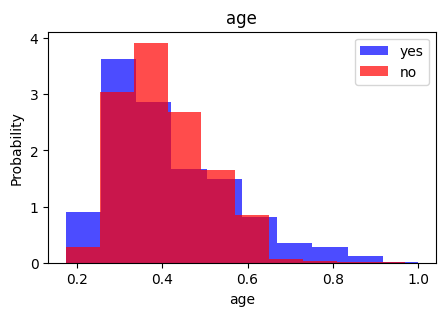

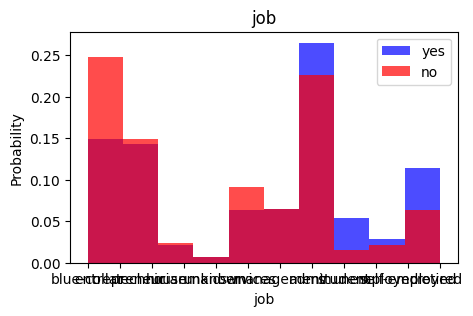

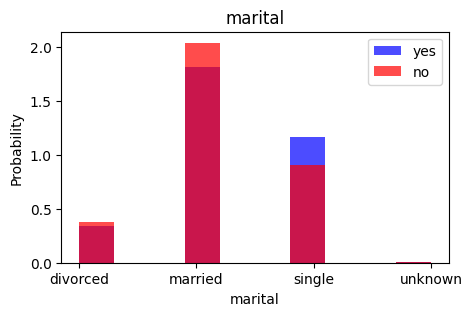

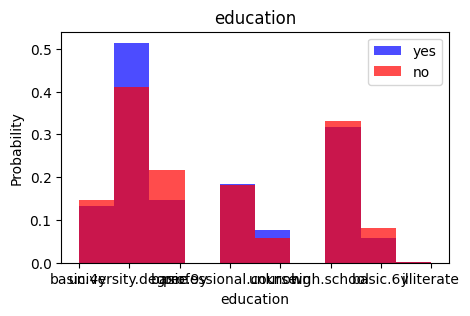

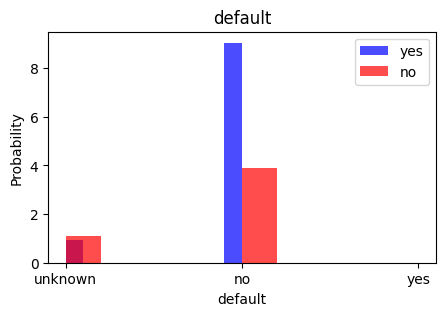

...

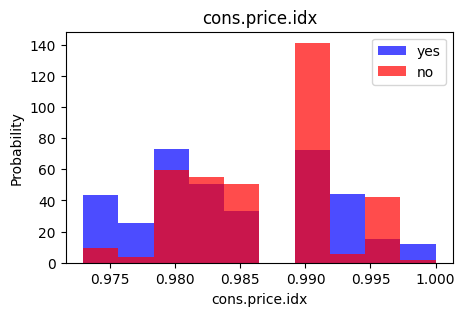

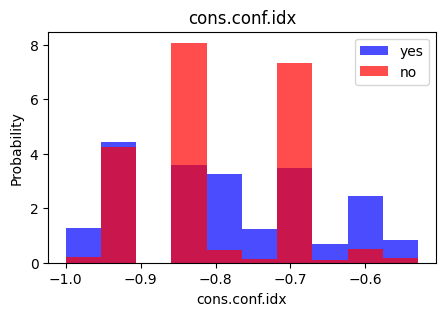

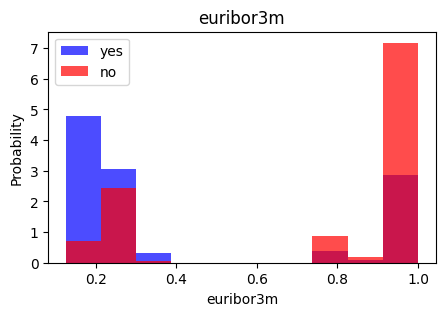

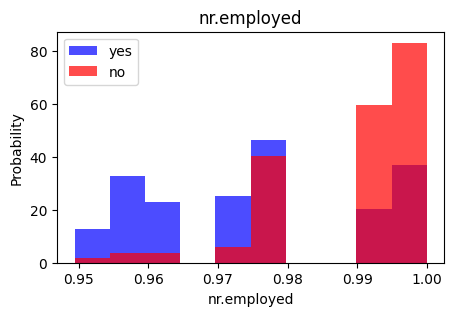

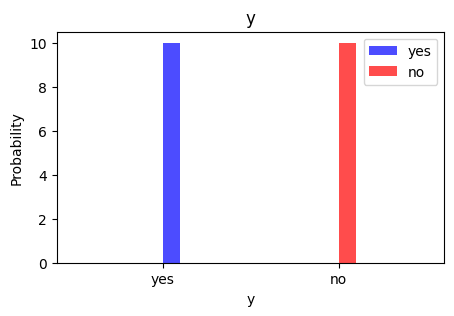

In [ ]:
import matplotlib.pyplot as plt

for label in df[:-1]:
  plt.figure(figsize=(5,3))
  plt.hist(df[df["y"]=='yes'][label], color='blue', label='yes', alpha=0.7, density=True)
  plt.hist(df[df["y"]=='no'][label], color='red', label='no', alpha=0.7, density=True)
  plt.title(label)
  plt.ylabel("Probability")
  plt.xlabel(label)
  plt.legend()
  plt.show()

Inspecting Data Types

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

Normalizing the numeric data columns

In [ ]:
cols = list(df.select_dtypes(include=['int64', 'float64' ]).columns)
for c in cols:
  df[c] = df[c] / df[c].abs().max()

In [ ]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,0.571429,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,0.017857,1.0,0.0,nonexistent,0.323529,0.991843,-0.716535,0.962735,0.992904,no
1,0.581633,services,married,high.school,unknown,no,no,telephone,may,mon,...,0.017857,1.0,0.0,nonexistent,0.323529,0.991843,-0.716535,0.962735,0.992904,no
2,0.377551,services,married,high.school,no,yes,no,telephone,may,mon,...,0.017857,1.0,0.0,nonexistent,0.323529,0.991843,-0.716535,0.962735,0.992904,no
3,0.408163,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,0.017857,1.0,0.0,nonexistent,0.323529,0.991843,-0.716535,0.962735,0.992904,no
4,0.571429,services,married,high.school,no,no,yes,telephone,may,mon,...,0.017857,1.0,0.0,nonexistent,0.323529,0.991843,-0.716535,0.962735,0.992904,no


Inspecting Missing Values

In [ ]:
df.isna().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

In given dataset, we have found multiple categorical data entries which are needed to be converted to numeric data type, in order to implement a classification model. For this purpose, we are using pandas get_dummies function.

In [ ]:
newdf = pd.get_dummies(df)
newdf.head()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success,y_no,y_yes
0,0.571429,0.053070,0.017857,1.0,0.0,0.323529,0.991843,-0.716535,0.962735,0.992904,...,0,1,0,0,0,0,1,0,1,0
1,0.581633,0.030297,0.017857,1.0,0.0,0.323529,0.991843,-0.716535,0.962735,0.992904,...,0,1,0,0,0,0,1,0,1,0
2,0.377551,0.045954,0.017857,1.0,0.0,0.323529,0.991843,-0.716535,0.962735,0.992904,...,0,1,0,0,0,0,1,0,1,0
3,0.408163,0.030704,0.017857,1.0,0.0,0.323529,0.991843,-0.716535,0.962735,0.992904,...,0,1,0,0,0,0,1,0,1,0
4,0.571429,0.062424,0.017857,1.0,0.0,0.323529,0.991843,-0.716535,0.962735,0.992904,...,0,1,0,0,0,0,1,0,1,0


We are renaming y_yes into "will_buy" and is droping y_no column from dataset. In will_buy column, 1 represents a value when customer will subscribed and 0 represents his unwillingness to buy the subscription.

In [ ]:
newdf.rename(columns = {'y_yes':'will_buy'}, inplace=True)
newdf.drop('y_no', axis=1, inplace=True)
newdf.head(3)

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,month_sep,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success,will_buy
0,0.571429,0.053070,0.017857,1.0,0.0,0.323529,0.991843,-0.716535,0.962735,0.992904,...,0,0,1,0,0,0,0,1,0,0
1,0.581633,0.030297,0.017857,1.0,0.0,0.323529,0.991843,-0.716535,0.962735,0.992904,...,0,0,1,0,0,0,0,1,0,0
2,0.377551,0.045954,0.017857,1.0,0.0,0.323529,0.991843,-0.716535,0.962735,0.992904,...,0,0,1,0,0,0,0,1,0,0


In [ ]:
X = newdf.drop(['will_buy'], axis=1)
Y = newdf['will_buy'].values

In [ ]:
X_train, X_test, Y_train,Y_test = train_test_split(X,Y , test_size = 0.3, random_state = 40, shuffle=True)

In [ ]:
xdf = pd.DataFrame(X)
ydf = pd.DataFrame(Y)
ydf.value_counts().to_frame().T

,0,1
0,36548,4640


From above, we can clearly see an imbalance between Yes and No values of buying term deposit. For this we will resample the minority class using SMOTE (Synthetic Minority Over-sampling Technique) from the imbalanced-learn library

In [ ]:
ydf.rename(columns={0:'y'}, inplace = True)
ydf.head(3)

,y
0,0
1,0
2,0


In [ ]:
from imblearn.over_sampling import SMOTE
xResamp, yResamp = SMOTE().fit_resample(xdf, ydf)

In [ ]:
print('Length of over sampled data: ', len(xResamp))
print('No of "subscribers" in over sampled data: ', len(yResamp[yResamp['y']==1]))
print('No of "non-subscribers" in over sampled data: ', len(yResamp[yResamp['y']==0]))

Length of over sampled data:  73096
No of "subscribers" in over sampled data:  36548
No of "non-subscribers" in over sampled data:  36548


**Implementation of XGB Classifier**

In [ ]:
model = XGBClassifier(n_estimators = 100, random_state = 101)
model.fit(xResamp, yResamp)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=101, ...)

**Local Scope for Instance # 4**

In [ ]:
np.random.seed(10)
predict_fn = lambda x: model.predict_proba(x)

explainer = lime.lime_tabular.LimeTabularExplainer(xResamp.values,mode='classification',
class_names=['yes', 'no'],training_labels=df['y'], feature_names=xResamp.columns.values)

# using LIME to get the explanations
i = 3
exp=explainer.explain_instance(X_test.values[i], predict_fn, num_features=5)
exp.show_in_notebook(show_table=True)

Above image show local interpretability for sample 4 using three different kinds of graphs.
The left most graph shows that sample 4 in given data shows 100 % confidence on likelihood of buying the term deposit.
The center graph shows the feature importance scores on this particular sample with duration having 30% feature importance score, followed by emp.var.rate with 10% and campaign, day_of_week_tues with 7% and defualt unknown 6 % feature importance score.  
The right graph shows the top five features and their respective values. The features highlighted in orange contribute toward class 0 (will_buy=no) whereas features highlighted in blue contribute toward class 1 (will_buy=yes).

**Local Scope for Index # 20**

In [ ]:
np.random.seed(10)
predict_fn = lambda x: model.predict_proba(x)
# Defining the LIME explainer object
explainer = lime.lime_tabular.LimeTabularExplainer(xResamp.values,mode='classification',
class_names=['yes', 'no'],training_labels=df['y'], feature_names=xResamp.columns.values)
# using LIME to get the explanations
i = 19
exp=explainer.explain_instance(X_test.values[i], predict_fn, num_features=5)
exp.show_in_notebook(show_table=True)

Above image show three different kinds of graphs.
The left most graph shows 100 % confidence on likelihood of buying the term deposit.
The center graph shows the feature importance scores on this particular sample with duration having 11% feature importance score, emp.var.rate with 11% score, followed by campaign & nr.employed with 8% feature score and day_of_week_tues with 7% feautre score respectively.
Emp.var.rate, campaign and nr.employed supports in buying of term deposit, while duration & day_of_week_tue does not support of buying the term deposit.
The right graph shows the top five features and their respective values. The features highlighted in orange contribute toward class 0 (will_buy=no) whereas features highlighted in blue contribute toward class 1 (will_buy=yes).

**Implementing Global Interpretability**

In [ ]:
import warnings
from lime import submodular_pick
sp_exp = submodular_pick.SubmodularPick(explainer,xResamp.values,predict_fn,num_features=5,num_exps_desired=6)

In [ ]:
[exp.show_in_notebook() for exp in sp_exp.sp_explanations]
print('SP-LIME Explanations.')

SP-LIME Explanations.


The above graphs show prediction probabilities along with features that support and that does not support in favor of buying the term deposit variabble y.

In [ ]:
import shap

In [ ]:
#fitting the explainer
explainer = shap.Explainer(model.predict, X_test)
shap_values = explainer(X_test)

Permutation explainer: 12358it [23:03,  8.90it/s]


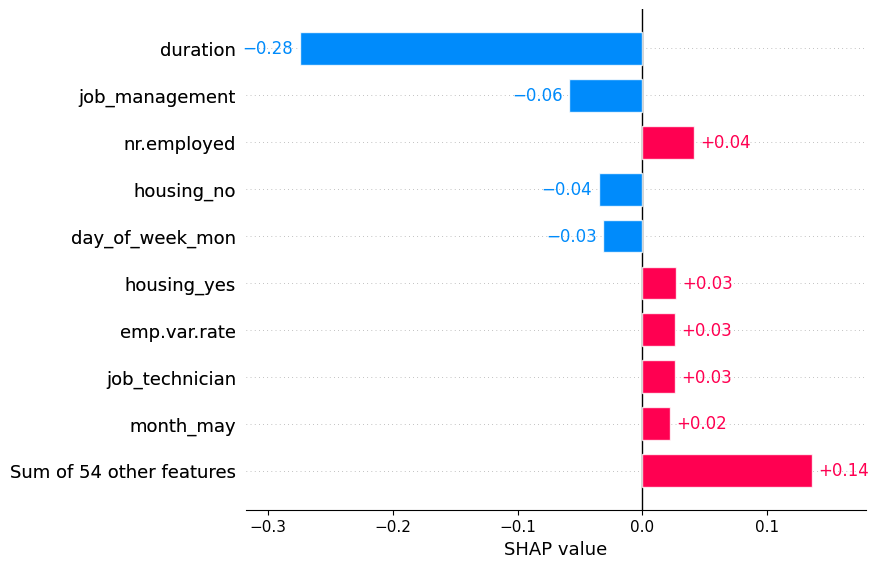

In [ ]:
shap.plots.bar(shap_values[3])

In [ ]:
shap.initjs()
shap.plots.force(shap_values[3])

In [ ]:
shap.initjs()
shap.plots.force(shap_values[19])

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


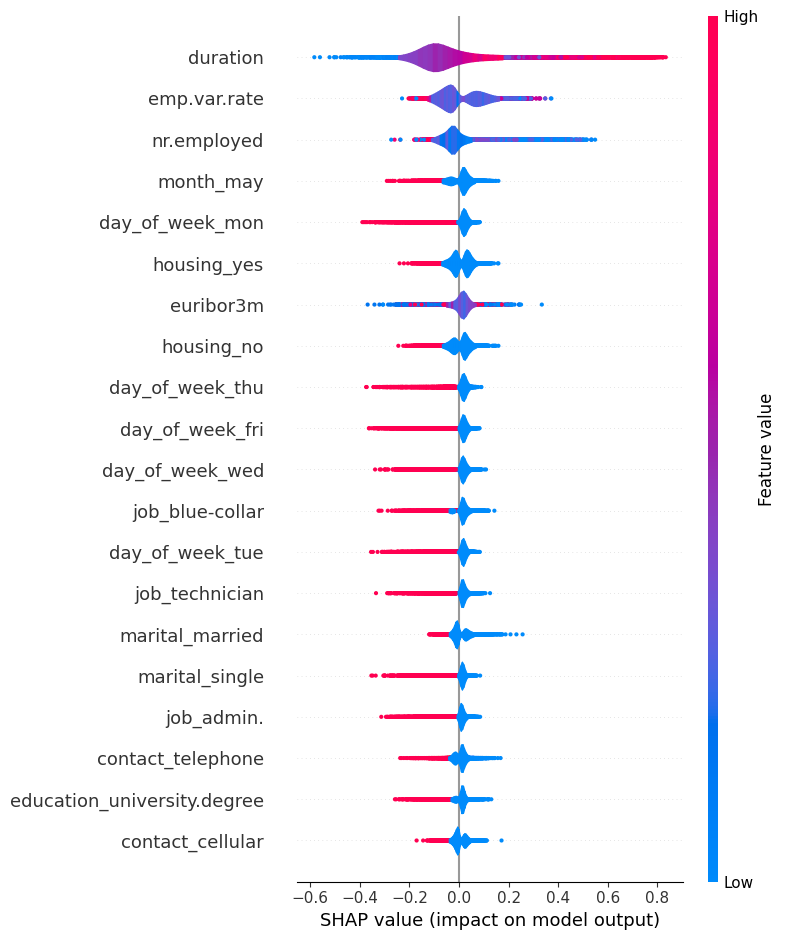

In [ ]:
shap.summary_plot(shap_values,plot_type='violin')